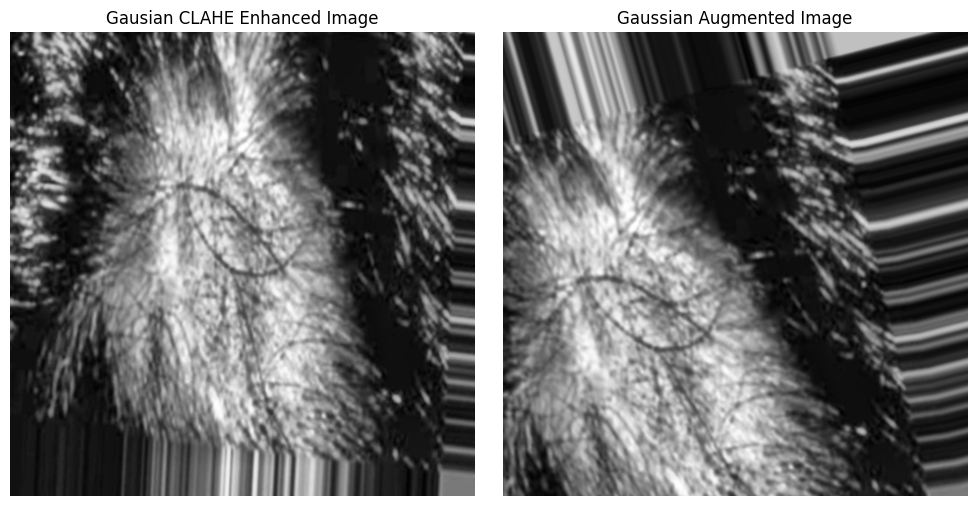

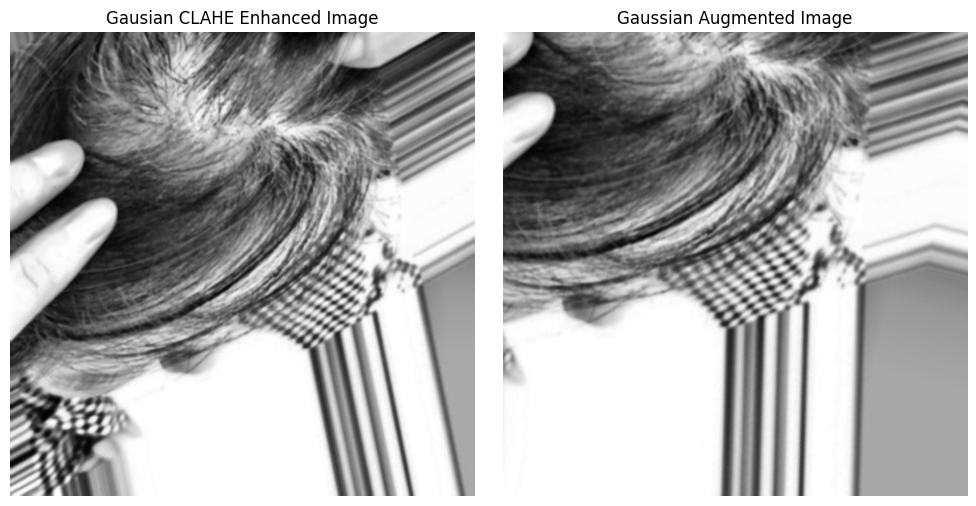

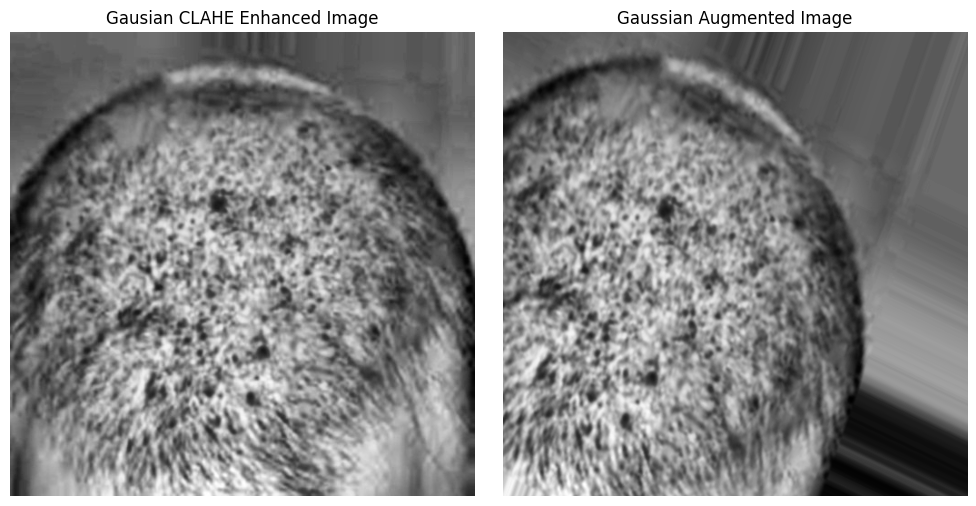

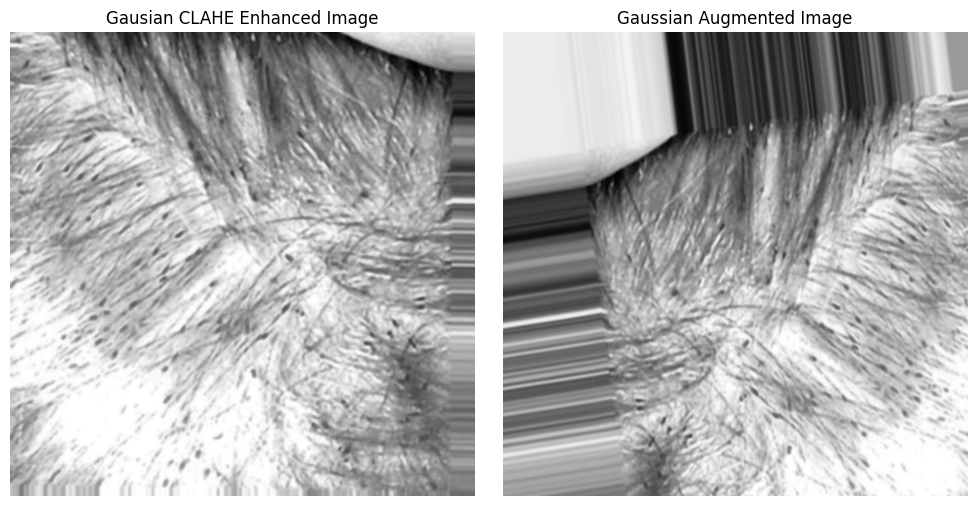

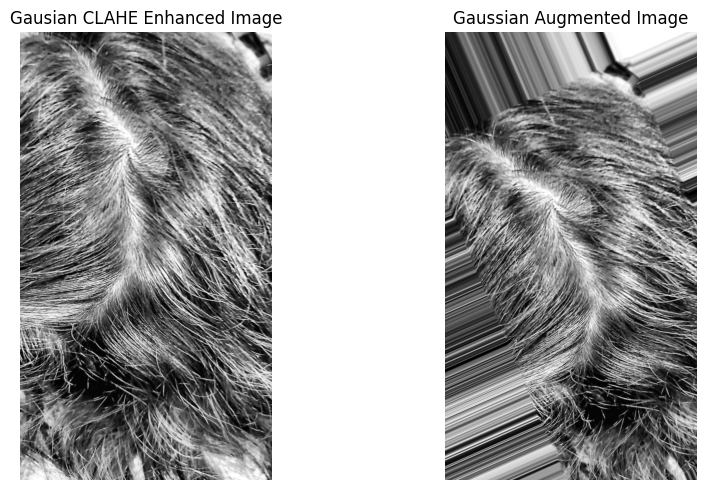

...

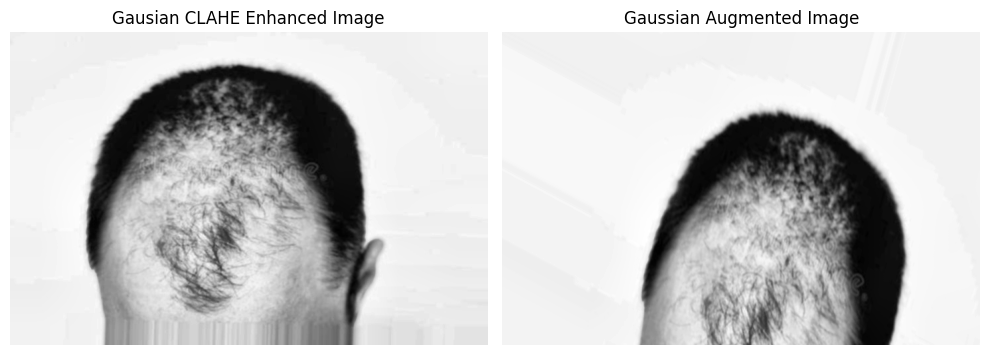

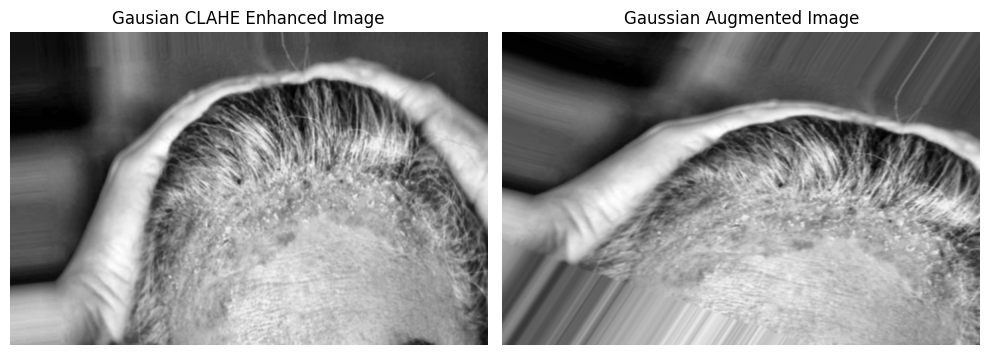

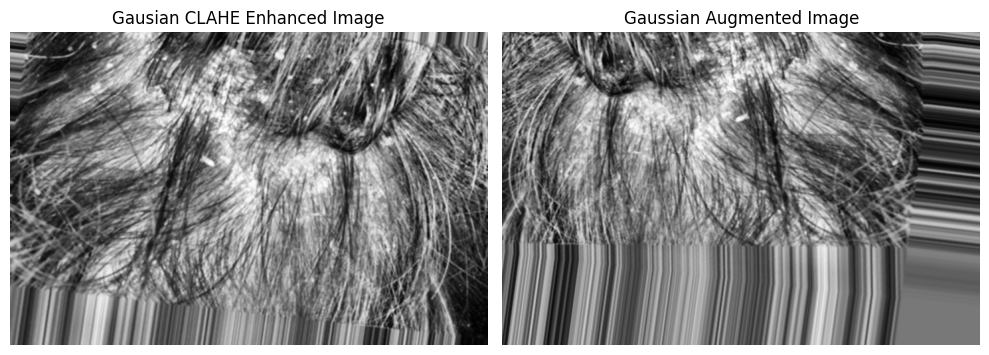

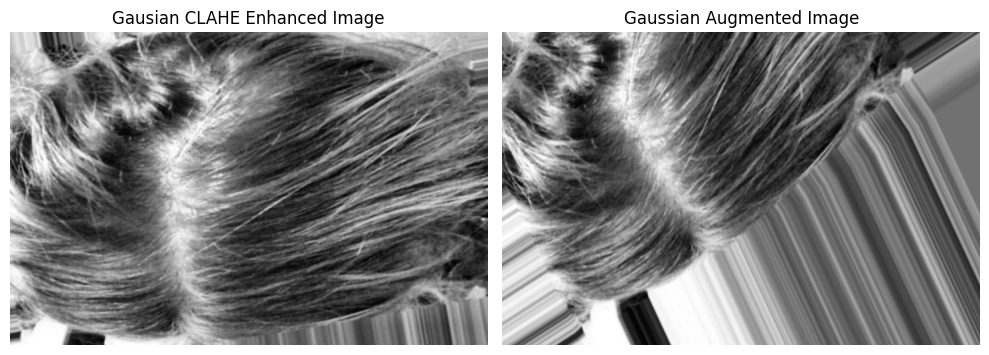

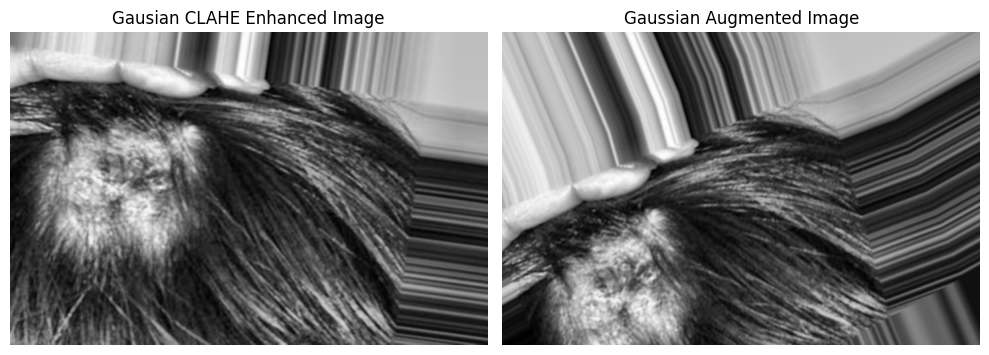

In [2]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator

def augment_image(image, augment_factor=5):
    """
    Augment the given image by applying random transformations.
    Parameters:
    - image: Input image.
    - augment_factor: Number of augmented images to generate per input image.
    Returns:
    - List of augmented images.
    """
    # Create an ImageDataGenerator object with desired augmentations
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Expand dimensions to add channel (grayscale image needs channel dimension)
    image = np.expand_dims(image, axis=-1)  # Add channel dimension (height, width, 1)
    image = np.expand_dims(image, axis=0)   # Add batch dimension (1, height, width, 1)

    # Generate augmented images
    augmented_images = []
    for _ in range(augment_factor):
        # Generate only one augmented image at a time
        aug_iter = datagen.flow(image, batch_size=1)
        augmented_image = aug_iter.next()[0].astype('uint8').squeeze()  # Remove extra dimensions
        augmented_images.append(augmented_image)
    
    return augmented_images

def is_image_file(filename):
    """
    Check if a file is an image based on its extension.
    """
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.tif', '.gif')
    return filename.lower().endswith(valid_extensions)

def augment_and_save_images(clahe_folder, augmented_output_folder, augment_factor=5):
    """
    Apply data augmentation to CLAHE-enhanced images and save them to a new folder.
    """
    # Ensure the augmented output folder exists
    if not os.path.exists(augmented_output_folder):
        os.makedirs(augmented_output_folder)

    for root, dirs, files in os.walk(clahe_folder):
        # Process each disease folder separately
        for disease_folder in dirs:
            disease_folder_path = os.path.join(root, disease_folder)
            image_found = False

            # Ensure the output path for this disease folder exists
            relative_path = os.path.relpath(disease_folder_path, clahe_folder)
            output_subfolder = os.path.join(augmented_output_folder, relative_path)
            if not os.path.exists(output_subfolder):
                os.makedirs(output_subfolder)

            # Process only the files in the disease folder
            for filename in os.listdir(disease_folder_path):
                image_path = os.path.join(disease_folder_path, filename)

                # Check if the path is a file and is an image
                if os.path.isfile(image_path) and is_image_file(filename):
                    # Read the CLAHE-enhanced image
                    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                    # Check if the image was successfully read
                    if image is None:
                        print(f"Error reading image: {image_path}")
                        continue

                    # Apply data augmentation
                    augmented_images = augment_image(image, augment_factor)

                    # Save the augmented images
                    for i, aug_image in enumerate(augmented_images):
                        output_path = os.path.join(output_subfolder, f"augmented_{i}_{filename}")
                        cv2.imwrite(output_path, aug_image)

                    if not image_found:
                        # Plot the CLAHE-enhanced image and one augmented image
                        plt.figure(figsize=(10, 5))
                        plt.subplot(1, 2, 1)
                        plt.imshow(image, cmap='gray')
                        plt.title('Gausian CLAHE Enhanced Image')
                        plt.axis('off')

                        plt.subplot(1, 2, 2)
                        plt.imshow(augmented_images[0], cmap='gray')
                        plt.title('Gaussian Augmented Image')
                        plt.axis('off')

                        plt.tight_layout()
                        plt.show()

                    image_found = True  # Mark this folder as having an image plotted

if __name__ == "__main__":
    # Folder containing Gaussian-filtered CLAHE images
    clahe_folder_path = r'E:\Project\hair diseases detection\Gaussian Filter\gaussian_clahe_images'
    # Folder where augmented images will be saved
    augmented_output_folder_path = r'E:\Project\hair diseases detection\Gaussian_augmented_images'

    # Apply data augmentation on CLAHE-enhanced images
    augment_and_save_images(clahe_folder_path, augmented_output_folder_path, augment_factor=5)
